In [437]:
# import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score

# Data Understanding

In [438]:
# Load the data 
data = pd.read_csv('Desktop/Internship task/data1.csv', ) 

In [439]:
# Count rows and columns
data.shape

(472, 116)

In [360]:
data

,Company_Name,Dependent-Company Status,year of founding,Age of company in years,Internet Activity Score,Short Description of company profile,Industry of company,Focus functions of company,Investors,Employee Count,Employees count MoM change,Has the team size grown,Est. Founding Date,Last Funding Date,Last Funding Amount,Country of company,Continent of company,Number of Investors in Seed,Number of Investors in Angel and or VC,Number of Co-founders,Number of of advisors,Team size Senior leadership,Team size all employees,Presence of a top angel or venture fund in previous round of investment,Number of of repeat investors,Number of Sales Support material,Worked in top companies,Average size of companies worked for in the past,Have been part of startups in the past?,Have been part of successful startups in the past?,Was he or she partner in Big 5 consulting?,Consulting experience?,Product or service company?,Catering to product/service across verticals,Focus on private or public data?,Focus on consumer data?,Focus on structured or unstructured data,Subscription based business,Cloud or platform based serive/product?,Local or global player,Linear or Non-linear business model,"Capital intensive business e.g. e-commerce, Engineering products and operations can also cause a business to be capital intensive",Number of of Partners of company,Crowdsourcing based business,Crowdfunding based business,Machine Learning based business,Predictive Analytics business,Speech analytics business,Prescriptive analytics business,Big Data Business,Cross-Channel Analytics/ marketing channels,Owns data or not? (monetization of data) e.g. Factual,Is the company an aggregator/market place? e.g. Bluekai,Online or offline venture - physical location based business or online venture?,B2C or B2B venture?,Top forums like 'Tech crunch' or 'Venture beat' talking about the company/model - How much is it being talked about?,Average Years of experience for founder and co founder,Exposure across the globe,Breadth of experience across verticals,Highest education,Years of education,Specialization of highest education,Relevance of education to venture,Relevance of experience to venture,Degree from a Tier 1 or Tier 2 university?,Renowned in professional circle,Experience in selling and building products,Experience in Fortune 100 organizations,Experience in Fortune 500 organizations,Experience in Fortune 1000 organizations,Top management similarity,Number of Recognitions for Founders and Co-founders,Number of of Research publications,Skills score,Team Composition score,Dificulty of Obtaining Work force,Pricing Strategy,Hyper localisation,Time to market service or product,Employee benefits and salary structures,Long term relationship with other founders,Proprietary or patent position (competitive position),Barriers of entry for the competitors,Company awards,Controversial history of founder or co founder,Legal risk and intellectual property,Client Reputation,google page rank of company website,Technical proficiencies to analyse and interpret unstructured data,Solutions offered,Invested through global incubation competitions?,Industry trend in investing,Disruptiveness of technology,Number of Direct competitors,Employees per year of company existence,Last round of funding received (in milionUSD),"Survival through recession, based on existence of the company through recession times",Time to 1st investment (in months),"Avg time to investment - average across all rounds, measured from previous investment",Gartner hype cycle stage,Time to maturity of technology (in years),Percent_skill_Entrepreneurship,Percent_skill_Operations,Percent_skill_Engineering,Percent_skill_Marketing,Percent_skill_Leadership,Percent_skill_Data Science,Percent_skill_Business Strategy,Percent_skill_Product Management,Percent_skill_Sales,Percent_skill_Domain,Percent_skill_Law,Percent_skill_Consulting,Percent_skill_Finance,Percent_skill_Investment,Renown score
0,Company1,Success,No Info,No Info,-1.0,Video di

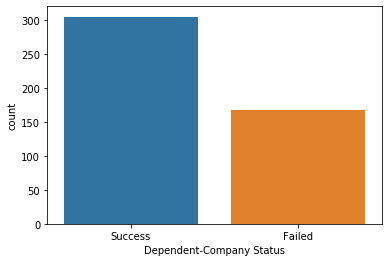

In [361]:
# Plot and exlude the dependent variable
sns.countplot(x = data['Dependent-Company Status'])

In [440]:
data['success_fail'] =  data['Dependent-Company Status'].map({'Success': 1, 'Failed': 0})

In [441]:
data[['success_fail', 'Dependent-Company Status']]

,success_fail,Dependent-Company Status
0,1,Success
1,1,Success
2,1,Success
3,1,Success
4,1,Success
5,1,Success
6,1,Success
7,1,Success
8,1,Success
9,1,Success


In [443]:

#Drop duclicated records
df = data.drop(['Dependent-Company Status'], axis = 1)
original_lenght = len(df)
df.drop_duplicates(inplace=True)
new_lenght = len(df)
print('There duplicated records percentage is:', round((1-new_lenght / original_lenght) * 100, 2), "%")

There duplicated records percentage is: 0.0 %


In [444]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [445]:
# Create a function for exploratory analysis
def analyzer(df, pred=None): 
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: [x.unique()])
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    missing_ration = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt() 
    print('Data shape:', df.shape)
    
    if pred is None:
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing ratio', 'uniques', 'skewness', 'kurtosis']
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis], axis = 1)

    else:
        corr = df.corr()[pred]
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis, corr], axis = 1, sort=False)
        corr_col = 'corr '  + pred
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ratio', 'uniques', 'skewness', 'kurtosis', corr_col ]
    
    str.columns = cols
    dtypes = str.types.value_counts()
    print('___________________________\nData types:\n',str.types.value_counts())
    print('___________________________')
    return str

In [446]:
# Data types
research  =  analyzer(df, pred = 'success_fail' )

Data shape: (472, 116)
___________________________
Data types:
 object     107
float64      5
int64        4
Name: types, dtype: int64
___________________________


In [449]:
# Identify and Drop variables with high ratios of missing data 
research.sort_values('missing_ratio', ascending=False)

,types,counts,distincts,nulls,missing_ratio,uniques,skewness,kurtosis,corr success_fail
Employees count MoM change,float64,267,42,205,43.432203,"[[0.0, nan, 10.0, 3.0, 8.0, -12.0, 45.0, 7.0, ...",-3.249389,11.632768,0.276640
Gartner hype cycle stage,object,300,6,172,36.440678,"[[nan, Trough, Trigger, Slope, Peak, Plateau]]",NaN,NaN,NaN
Time to maturity of technology (in years),object,300,5,172,36.440678,"[[nan, 2 to 5, 5 to 10, 0 to 2, 0 to 5]]",NaN,NaN,NaN
Employee Count,float64,306,85,166,35.169492,"[[3.0, nan, 14.0, 45.0, 39.0, 7.0, 29.0, 16.0,...",5.050352,32.900557,0.100543
Last Funding Amount,float64,312,143,160,33.898305,"[[450000.0, nan, 2350000.0, 10250000.0, 550000...",3.284950,14.463164,-0.032599
Short Description of company profile,object,323,314,149,31.567797,"[[Video distribution, nan, Event Data Analytic...",NaN,NaN,NaN
Investors,object,332,320,140,29.661017,[[KPCB Holdings|Draper Fisher Jurvetson (DFJ)|...,NaN,NaN,NaN
Industry of company,object,348,193,124,26.271186,"[[nan, Market Research|Marketing|Crowdfunding,...",NaN,NaN,NaN
Last Funding Date,object,350,285,122,25.847458,"[[5/26/2013, nan, 10/23/2013, 5/10/2012, 12/11...",NaN,NaN,NaN
Est. Founding Date,object,363,161,109,23.093220,"[[nan, 12/1/2011, 6/20/2009, 4/1/2010, 5/1/201...",NaN,NaN,NaN


In [450]:
dfnew = df.drop(['Employees count MoM change', 
                 'Gartner hype cycle stage', 
                 'Time to maturity of technology (in years)',
                 'Employee Count', 'Last Funding Amount',
                 'Short Description of company profile', 'Investors', 'Industry of company',
                 'Last Funding Date', 'Est. Founding Date', 'Specialization of highest education'  ], axis = 1)

In [370]:
dfnew=  dfnew.fillna(0)
dfnew

,Company_Name,year of founding,Age of company in years,Internet Activity Score,Focus functions of company,Has the team size grown,Country of company,Continent of company,Number of Investors in Seed,Number of Investors in Angel and or VC,Number of Co-founders,Number of of advisors,Team size Senior leadership,Team size all employees,Presence of a top angel or venture fund in previous round of investment,Number of of repeat investors,Number of Sales Support material,Worked in top companies,Average size of companies worked for in the past,Have been part of startups in the past?,Have been part of successful startups in the past?,Was he or she partner in Big 5 consulting?,Consulting experience?,Product or service company?,Catering to product/service across verticals,Focus on private or public data?,Focus on consumer data?,Focus on structured or unstructured data,Subscription based business,Cloud or platform based serive/product?,Local or global player,Linear or Non-linear business model,"Capital intensive business e.g. e-commerce, Engineering products and operations can also cause a business to be capital intensive",Number of of Partners of company,Crowdsourcing based business,Crowdfunding based business,Machine Learning based business,Predictive Analytics business,Speech analytics business,Prescriptive analytics business,Big Data Business,Cross-Channel Analytics/ marketing channels,Owns data or not? (monetization of data) e.g. Factual,Is the company an aggregator/market place? e.g. Bluekai,Online or offline venture - physical location based business or online venture?,B2C or B2B venture?,Top forums like 'Tech crunch' or 'Venture beat' talking about the company/model - How much is it being talked about?,Average Years of experience for founder and co founder,Exposure across the globe,Breadth of experience across verticals,Highest education,Years of education,Relevance of education to venture,Relevance of experience to venture,Degree from a Tier 1 or Tier 2 university?,Renowned in professional circle,Experience in selling and building products,Experience in Fortune 100 organizations,Experience in Fortune 500 organizations,Experience in Fortune 1000 organizations,Top management similarity,Number of Recognitions for Founders and Co-founders,Number of of Research publications,Skills score,Team Composition score,Dificulty of Obtaining Work force,Pricing Strategy,Hyper localisation,Time to market service or product,Employee benefits and salary structures,Long term relationship with other founders,Proprietary or patent position (competitive position),Barriers of entry for the competitors,Company awards,Controversial history of founder or co founder,Legal risk and intellectual property,Client Reputation,google page rank of company website,Technical proficiencies to analyse and interpret unstructured data,Solutions offered,Invested through global incubation competitions?,Industry trend in investing,Disruptiveness of technology,Number of Direct competitors,Employees per year of company existence,Last round of funding received (in milionUSD),"Survival through recession, based on existence of the company through recession times",Time to 1st investment (in months),"Avg time to investment - average across all rounds, measured from previous investment",Percent_skill_Entrepreneurship,Percent_skill_Operations,Percent_skill_Engineering,Percent_skill_Marketing,Percent_skill_Leadership,Percent_skill_Data Science,Percent_skill_Business Strategy,Percent_skill_Product Management,Percent_skill_Sales,Percent_skill_Domain,Percent_skill_Law,Percent_skill_Consulting,Percent_skill_Finance,Percent_skill_Investment,Renown score,success_fail
0,Company1,No Info,No Info,-1.0,operation,No,United States,North America,2,0,1,2,2,15,Yes,4,Nothing,No,Small,No,No,No,No,Service,No,Private,No,Both,Yes,Platform,Global,Linear,Yes,None,No,No,No,No,No,No,No,No,No,Yes,Online,B2C,High,High,Yes,Low,Masters,21,Yes,Yes,Tier_1,500,Medium,0,0,0,None,0,None,0,Low,Low,Yes,No,High,No Info,

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\ops\__init__.py:1115: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


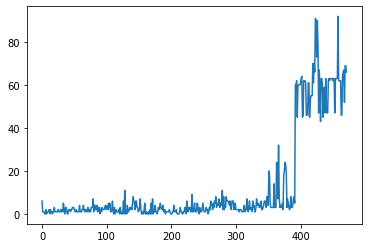

In [451]:
noinfo = (df == 'No Info').sum(axis=1)
plt.plot(noinfo)

In [463]:

dfnew =  df.drop(df.index[395:473],0)


In [464]:
#Cheking for index and filling annasigned values
dfnew = dfnew.replace('No Info', 0)
dfnew= dfnew.replace('None', 0)
dfnew= dfnew.replace('Yes', 1)
dfnew= dfnew.replace('No', 0)
dfnew= dfnew.replace('yes', 1)
dfnew= dfnew.replace('YES', 1)
dfnew= dfnew.replace('no', 0)
dfnew= dfnew.replace('NaN', 0)
dfnew= dfnew.replace('Not Applicable', 0)

, 0#data.index.values

'0#data.index.values'

In [465]:
dfnew.fillna(0, inplace = True)

In [466]:
dfnew['success_fail']

0      1
1      1
2      1
3      1
4      1
5      1
6      1
7      1
8      1
9      1
10     1
11     1
12     1
13     1
14     1
15     1
16     1
17     1
18     1
19     1
20     1
21     1
22     1
23     1
24     1
25     1
26     1
27     1
28     1
29     1
30     1
31     1
32     1
33     1
34     1
35     1
36     1
37     1
38     1
39     1
40     1
41     1
42     1
43     1
44     1
45     1
46     1
47     1
48     1
49     0
50     1
51     1
52     1
53     1
54     1
55     1
56     1
57     1
58     1
59     1
60     1
61     1
62     1
63     1
64     1
65     1
66     1
67     1
68     1
69     1
70     1
71     1
72     1
73     1
74     1
75     1
76     1
77     1
78     1
79     1
80     1
81     1
82     1
83     1
84     1
85     1
86     1
87     1
88     1
89     1
90     1
91     1
92     1
93     1
94     1
95     1
96     1
97     1
98     1
99     1
100    1
101    1
102    1
103    1
104    1
105    1
106    1
107    1
108    1
109    1
110    1
1

In [467]:
dfnew.dtypes.value_counts()

object     71
int64      39
float64     6
dtype: int64

In [468]:
#Create seperate dataframe for numerical variables
integers = dfnew.select_dtypes(exclude = 'object')

In [469]:
y =  integers['success_fail']

# EDA

In [470]:
int_an = analyzer(integers, pred = 'success_fail')

Data shape: (395, 45)
___________________________
Data types:
 int64      39
float64     6
Name: types, dtype: int64
___________________________


In [471]:
int_an.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45 entries, Internet Activity Score to success_fail
Data columns (total 9 columns):
types                45 non-null object
counts               45 non-null int64
distincts            45 non-null int64
nulls                45 non-null int64
missing_ratio        45 non-null float64
uniques              45 non-null object
skewness             45 non-null float64
kurtosis             45 non-null float64
corr success_fail    45 non-null float64
dtypes: float64(4), int64(3), object(2)
memory usage: 4.8+ KB


In [472]:
int_an.sort_values('corr success_fail')

,types,counts,distincts,nulls,missing_ratio,uniques,skewness,kurtosis,corr success_fail
Consulting experience?,int64,395,2,0,0.0,"[[0.0, 1.0]]",0.188887,-1.974344,-0.232979
Is the company an aggregator/market place? e.g. Bluekai,int64,395,2,0,0.0,"[[1.0, 0.0]]",1.251859,-0.435077,-0.210688
Solutions offered,int64,395,2,0,0.0,"[[1.0, 0.0]]",-0.209519,-1.966083,-0.125364
Crowdsourcing based business,int64,395,2,0,0.0,"[[0.0, 1.0]]",3.515186,10.409216,-0.099210
Have been part of successful startups in the past?,int64,395,2,0,0.0,"[[0.0, 1.0]]",-0.292773,-1.924052,-0.091571
Hyper localisation,int64,395,2,0,0.0,"[[0.0, 1.0]]",1.947102,1.800297,-0.072799
Have been part of startups in the past?,int64,395,2,0,0.0,"[[0.0, 1.0]]",-0.693693,-1.526545,-0.067739
Controversial history of founder or co founder,int64,395,2,0,0.0,"[[0.0, 1.0]]",6.066735,34.982374,-0.066147
"Capital intensive business e.g. e-commerce, Engineering products and operations can also cause a business to be capital intensive",int64,395,2,0,0.0,"[[1.0, 0.0]]",1.109056,-0.773939,-0.010474
Pricing Strategy,int64,395,2,0,0.0,"[[1.0, 0.0]]",0.076294,-2.004354,0.015597


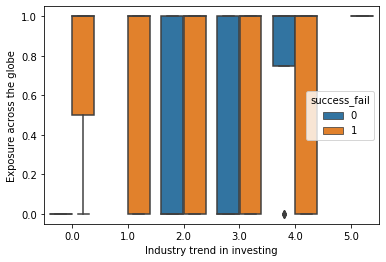

In [473]:
sns.boxplot(x = 'Industry trend in investing', y = 'Exposure across the globe', hue = 'success_fail', data= dfnew)

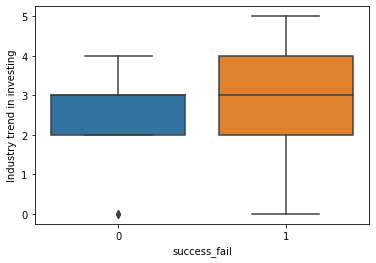

In [484]:
sns.boxplot(y = 'Industry trend in investing', x = 'success_fail', data= dfnew)

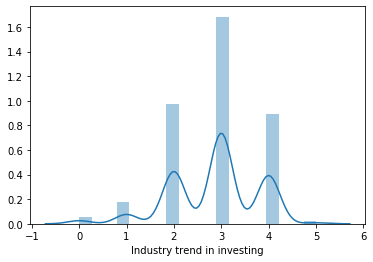

In [485]:
sns.distplot(dfnew['Industry trend in investing'])


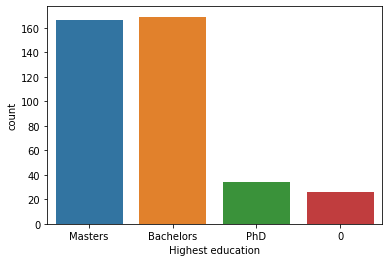

In [505]:
sns.countplot(x= dfnew['Highest education'])

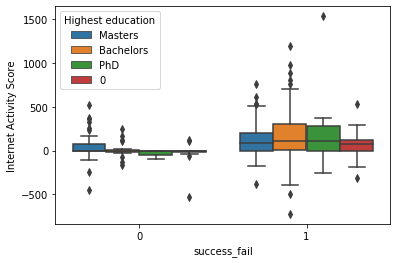

In [506]:
sns.boxplot(y = 'Internet Activity Score', x = 'success_fail', hue = 'Highest education', data= dfnew)

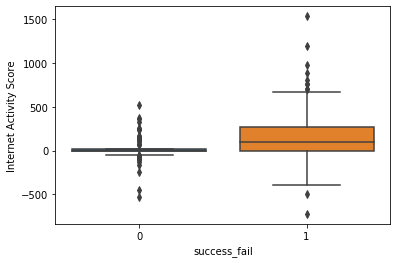

In [507]:
sns.boxplot(y = 'Internet Activity Score', x = 'success_fail', data= dfnew)

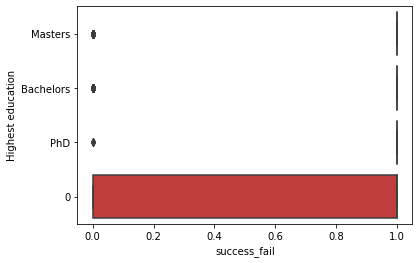

In [508]:
sns.boxplot(y = 'Highest education', x = 'success_fail', data= dfnew)

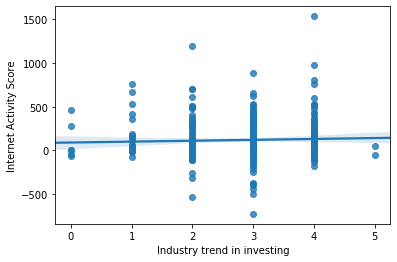

In [509]:
sns.regplot('Industry trend in investing', 'Internet Activity Score', dfnew)

In [510]:
#Correletion matrix of numerical variables
cor =  integers.corr()
cor

,Internet Activity Score,Employee Count,Employees count MoM change,Has the team size grown,Last Funding Amount,Number of Co-founders,Number of of advisors,Team size Senior leadership,Presence of a top angel or venture fund in previous round of investment,Worked in top companies,Have been part of startups in the past?,Have been part of successful startups in the past?,Was he or she partner in Big 5 consulting?,Consulting experience?,Catering to product/service across verticals,Focus on consumer data?,Subscription based business,"Capital intensive business e.g. e-commerce, Engineering products and operations can also cause a business to be capital intensive",Crowdsourcing based business,Crowdfunding based business,Machine Learning based business,Predictive Analytics business,Speech analytics business,Prescriptive analytics business,Big Data Business,Cross-Channel Analytics/ marketing channels,Owns data or not? (monetization of data) e.g. Factual,Is the company an aggregator/market place? e.g. Bluekai,Exposure across the globe,Relevance of education to venture,Relevance of experience to venture,Pricing Strategy,Hyper localisation,Long term relationship with other founders,Proprietary or patent position (competitive position),Barriers of entry for the competitors,Company awards,Controversial history of founder or co founder,Legal risk and intellectual property,Technical proficiencies to analyse and interpret unstructured data,Solutions offered,Invested through global incubation competitions?,Industry trend in investing,"Survival through recession, based on existence of the company through recession times",success_fail
Internet Activity Score,1.000000,0.116058,0.116556,0.203845,0.081969,0.088795,0.077157,0.091277,0.051983,0.025611,-0.096511,-0.111549,0.095103,-0.022488,0.140867,0.060333,0.069925,0.009639,-0.009936,-0.056163,0.053089,0.127943,0.008455,0.117355,0.125546,0.091617,-0.062228,-0.031201,0.058942,-0.026905,-0.003072,0.100175,0.011457,0.183578,0.150291,-0.009115,0.137912,-0.030609,-0.041744,0.154729,0.005559,0.191000,0.040892,-0.072749,0.254576
Employee Count,0.116058,1.000000,0.075799,0.301437,0.440956,-0.000620,0.091673,0.453088,0.079507,0.119106,-0.058092,-0.048306,-0.037366,-0.072072,0.098626,0.146828,-0.020437,-0.009087,0.005935,-0.034521,-0.083375,0.140317,-0.068031,0.129555,0.144928,0.087300,-0.016155,0.014416,0.164199,0.089949,0.102949,-0.051872,-0.113782,0.179146,0.012980,0.000836,0.168849,-0.016422,0.014256,0.104274,0.026139,-0.004174,0.048774,0.326525,0.127044
Employees count MoM change,0.116556,0.075799,1.000000,0.116226,0.089738,-0.000574,0.054954,0.095282,-0.081953,-0.026856,0.021885,0.010021,0.046849,0.056526,0.038304,0.094619,-0.076731,0.020257,0.032560,-0.105125,-0.031334,0.068576,-0.021407,0.037012,0.089655,0.101480,0.056443,-0.019223,0.060867,0.028240,-0.011536,0.040376,-0.067161,0.055519,0.032317,0.023154,-0.018590,0.034569,-0.016202,0.020509,0.096054,-0.059871,0.134278,0.001286,0.154137
Has the team size grown,0.203845,0.301437,0.116226,1.000000,0.276308,0.083256,0.303387,0.311271,0.267420,0.112429,-0.023778,-0.004159,0.071360,-0.182391,0.165952,0.157341,0.208693,0.059609,0.001277,-0.070308,-0.009423,0.098939,0.022286,0.295964,0.097955,0.128591,-0.013583,-0.019056,0.171543,-0.016330,0.023663,-0.131724,-0.028111,0.193744,0.133488,0.032525,0.157894,0.039043,0.041624,0.040593,-0.076860,0.054436,0.064718,0.150489,0.191340
Last Funding Amount,0.081969,0.440956,0.089738,0.276308,1.000000,0.049836,0.193941,0.463970,0.302625,0.117039,-0.042730,0.005835,-0.001268,-0.148940,0.066695,0.140600,-0.070288,0.101484,0.028821,-0.051155,-0.081879,0.039323,-0.057095,0.072192,0.183049,0.016554,-0.049321,-0.044579,0.147460,0.029638,0.087549,0.024599,-0.061861,0.074551,0.117491,0.097356,0.147700,0.141056,-0.001495,0.004457,0.045353,0.007986,0.154451,0.246299,0.046859
Number of Co-founders,0.088795,-0.000620,-0.000574,0.083256,0.049836,1.000000,0.081381,0.130878,0.078050,-0.032828,-0.019132,-0.071985,0.104759,-0.033503,-0.011

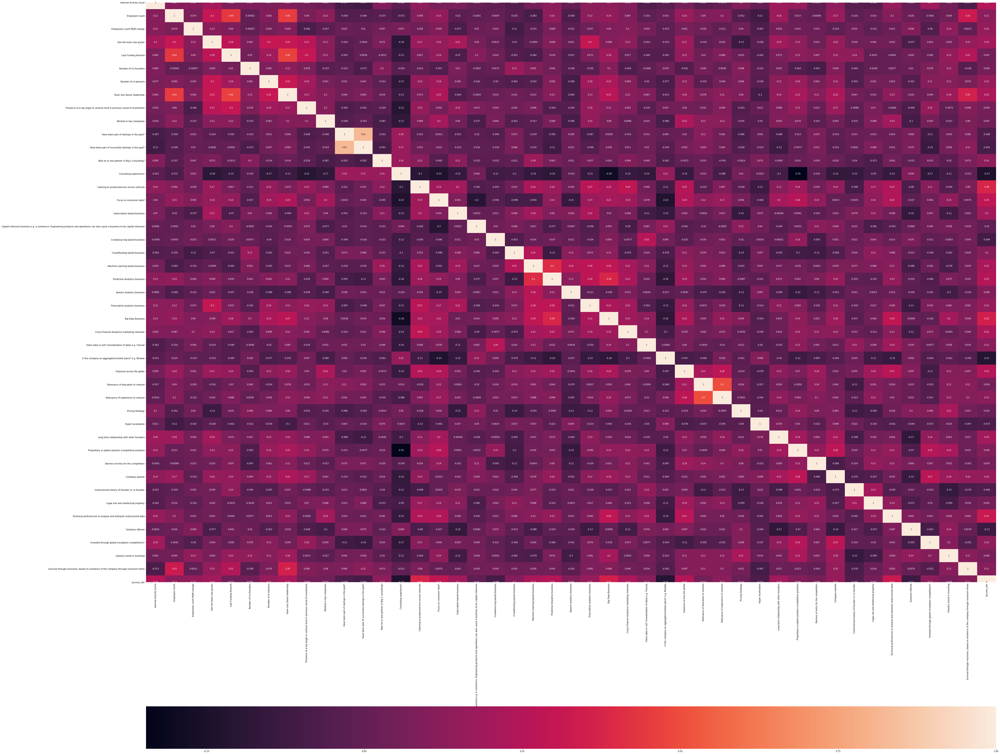

In [511]:
fig, ax = plt.subplots(figsize=(70,70)) 
sns.heatmap(integers.corr(), ax=ax,annot = True,  cbar_kws= {'orientation': 'horizontal'} )


# Modelling

In [512]:
logreg = LogisticRegression()

In [513]:
#Drop highly correleted and dependent variables
X = integers.drop(['success_fail', 'Have been part of successful startups in the past?'], axis =1 )

In [514]:
#Split and Fit to logisitcs regression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [515]:
logreg.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [516]:
predict = logreg.predict(X_test)

In [517]:
print(classification_report(predict, y_test))

              precision    recall  f1-score   support

           0       0.28      0.57      0.37        14
           1       0.94      0.82      0.88       117

    accuracy                           0.79       131
   macro avg       0.61      0.70      0.62       131
weighted avg       0.87      0.79      0.82       131



In [518]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, predict)
cnf_matrix

array([[ 8, 21],
       [ 6, 96]], dtype=int64)

Text(0.5, 15.0, 'Predicted label')

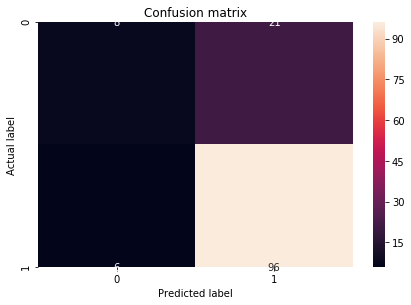

In [525]:
sns.heatmap((cnf_matrix), annot=True, fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [526]:
print("Accuracy:",metrics.accuracy_score(y_test, predict))
print("Precision:",metrics.precision_score(y_test, predict))
print("Recall:",metrics.recall_score(y_test, predict))
print("F1 Score:",metrics.f1_score(y_test,predict))


Accuracy: 0.7938931297709924
Precision: 0.8205128205128205
Recall: 0.9411764705882353
F1 Score: 0.8767123287671232


In [527]:
cross_val_score(
...     logreg, X_test, y_test, cv=12, scoring='f1_macro')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

array([0.62105263, 0.87368421, 0.87368421, 0.7       , 0.55555556,
       0.45      , 0.80392157, 0.6       , 0.375     , 0.41176471,
       0.41176471, 0.44444444])

In [528]:
from xgboost import XGBClassifier

In [529]:
tree = DecisionTreeClassifier()

In [530]:
tree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [531]:
predict = tree.predict(X_test)

In [532]:
print(classification_report(predict, y_test))

              precision    recall  f1-score   support

           0       0.52      0.58      0.55        26
           1       0.89      0.87      0.88       105

    accuracy                           0.81       131
   macro avg       0.70      0.72      0.71       131
weighted avg       0.82      0.81      0.81       131



In [533]:
print("Accuracy:",metrics.accuracy_score(y_test, predict))
print("Precision:",metrics.precision_score(y_test, predict))
print("Recall:",metrics.recall_score(y_test, predict))
print("F1 Score:",metrics.f1_score(y_test,predict))


Accuracy: 0.8091603053435115
Precision: 0.8666666666666667
Recall: 0.8921568627450981
F1 Score: 0.8792270531400966


In [534]:
cross_val_score(
...     logreg, X_test, y_test, cv=12, scoring='f1_macro')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

array([0.62105263, 0.87368421, 0.87368421, 0.7       , 0.55555556,
       0.45      , 0.80392157, 0.6       , 0.375     , 0.41176471,
       0.41176471, 0.44444444])

In [535]:
random = RandomForestClassifier()

In [536]:
random.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [537]:
predict = random.predict(X_test)

In [538]:
print(classification_report(predict, y_test))

              precision    recall  f1-score   support

           0       0.41      0.71      0.52        17
           1       0.95      0.85      0.90       114

    accuracy                           0.83       131
   macro avg       0.68      0.78      0.71       131
weighted avg       0.88      0.83      0.85       131



In [542]:
xgb =XGBClassifier()

In [543]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [554]:
predictions =  xgb.predict(X_test)

In [555]:
print(classification_report(predictions, y_test))

              precision    recall  f1-score   support

           0       0.48      0.82      0.61        17
           1       0.97      0.87      0.92       114

    accuracy                           0.86       131
   macro avg       0.73      0.85      0.76       131
weighted avg       0.91      0.86      0.88       131



In [556]:
cross_val_score(
...     xgb, X_test, y_test, cv=12, scoring='f1_macro')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


array([0.42857143, 0.7       , 0.55555556, 0.77777778, 0.87368421,
       0.80701754, 1.        , 0.41176471, 1.        , 0.44444444,
       1.        , 0.76190476])

[0.08312121 0.03341758 0.01126994 0.0446107  0.01591112 0.02926074
 0.01529266 0.02771242 0.04722756 0.         0.01332021 0.
 0.00871932 0.02981252 0.03336496 0.01675732 0.02718079 0.0801876
 0.         0.00947353 0.00948503 0.         0.         0.12640506
 0.         0.         0.02795012 0.00615134 0.00938928 0.00412935
 0.01715311 0.01979164 0.02128418 0.02095313 0.0153368  0.
 0.         0.         0.05392099 0.01430298 0.         0.03352457
 0.09358225]


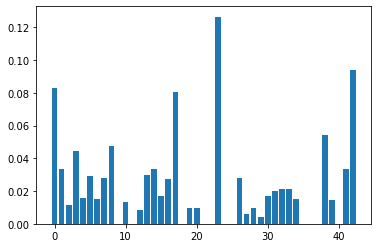

In [557]:
print(xgb.feature_importances_)
# plot
plt.bar(range(len(xgb.feature_importances_)), xgb.feature_importances_)
plt.show()

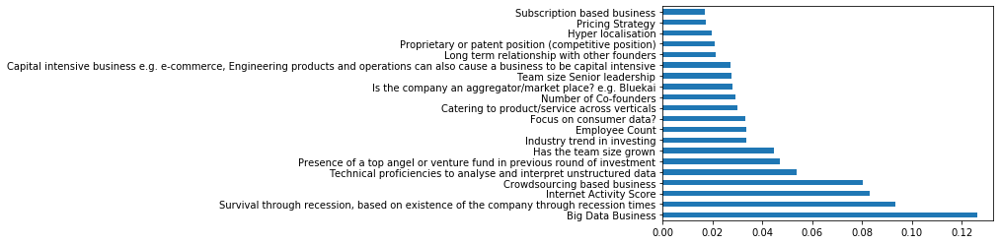

In [558]:
feat_importances = pd.Series(xgb.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.show()

In [559]:
cat = dfnew.select_dtypes(include = 'object')

In [560]:
cat

,Company_Name,year of founding,Age of company in years,Short Description of company profile,Industry of company,Focus functions of company,Investors,Est. Founding Date,Last Funding Date,Country of company,Continent of company,Number of Investors in Seed,Number of Investors in Angel and or VC,Team size all employees,Number of of repeat investors,Number of Sales Support material,Average size of companies worked for in the past,Product or service company?,Focus on private or public data?,Focus on structured or unstructured data,Cloud or platform based serive/product?,Local or global player,Linear or Non-linear business model,Number of of Partners of company,Online or offline venture - physical location based business or online venture?,B2C or B2B venture?,Top forums like 'Tech crunch' or 'Venture beat' talking about the company/model - How much is it being talked about?,Average Years of experience for founder and co founder,Breadth of experience across verticals,Highest education,Years of education,Specialization of highest education,Degree from a Tier 1 or Tier 2 university?,Renowned in professional circle,Experience in selling and building products,Experience in Fortune 100 organizations,Experience in Fortune 500 organizations,Experience in Fortune 1000 organizations,Top management similarity,Number of Recognitions for Founders and Co-founders,Number of of Research publications,Skills score,Team Composition score,Dificulty of Obtaining Work force,Time to market service or product,Employee benefits and salary structures,Client Reputation,google page rank of company website,Disruptiveness of technology,Number of Direct competitors,Employees per year of company existence,Last round of funding received (in milionUSD),Time to 1st investment (in months),"Avg time to investment - average across all rounds, measured from previous investment",Gartner hype cycle stage,Time to maturity of technology (in years),Percent_skill_Entrepreneurship,Percent_skill_Operations,Percent_skill_Engineering,Percent_skill_Marketing,Percent_skill_Leadership,Percent_skill_Data Science,Percent_skill_Business Strategy,Percent_skill_Product Management,Percent_skill_Sales,Percent_skill_Domain,Percent_skill_Law,Percent_skill_Consulting,Percent_skill_Finance,Percent_skill_Investment,Renown score
0,Company1,0,0,Video distribution,0,operation,KPCB Holdings|Draper Fisher Jurvetson (DFJ)|Kl...,0,5/26/2013,United States,North America,2,0,15,4,Nothing,Small,Service,Private,Both,Platform,Global,Linear,0,Online,B2C,High,High,Low,Masters,21,business,Tier_1,500,Medium,0,0,0,0,0,0,0,Low,Low,High,0,0,9626884,Low,0,1.5,0.45,0,11.56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Company2,2011,3,0,Market Research|Marketing|Crowdfunding,"Marketing, sales",0,0,0,United States,North America,5,0,20,0,medium,Large,Product,Public,Both,Platform,Local,Non-Linear,Few,Online,B2C,Low,High,High,Masters,21,Supply Chain Management & Entrepreneurship,Tier_1,500,High,0,0,0,Medium,13,0,34,High,Medium,Low,0,Medium,1067034,Medium,0,6.666666667,5,10,9,Trough,2 to 5,15.88235294,11.76470588,15,12.94117647,0,8.823529412,21.76470588,10.88235294,2.941176471,0,0,0,0,0,8
2,Company3,2011,3,Event Data Analytics API,Analytics|Cloud Computing|Software Development,operations,TechStars|Streamlined Ventures|Amplify Partner...,12/1/2011,10/23/2013,United States,North America,15,0,10,0,low,Medium,Both,Private,Both,cloud,Local,Non-Linear,Few,Online,B2B,Low,Medium,Low,Bachelors,18,General,Tier_2,500,High,0,0,1,Medium,18,0,36,High,Medium,Low,0,Low,71391,Medium,0,3.333333333,2.35,2,7.344444444,Trough,2 to 5,9.401709402,0,57.47863248,0,0,3.846153846,17.09401709,9.401709402,0,2.777777778,0,0,0,0,9
3,Company4,2009,5,The most advanced analytics for mobile,Mobile|Analytics,Marketing & Sales,Michael Birch|Max Levchin|Sequoia Capital|Keit...,6/20/2009,5/10/2012,United States,North America,6,0,50,0,low,Large,Product,Public,Structured,Platform,Local,Non-Linear,Few,Online,B2C,Medium,Medium,Low,Bachelors,18,Computer Systems Engineering,Tie

In [561]:
cat['years_fund'] = pd.to_numeric(cat['year of founding'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [562]:
cat['age'] = pd.to_numeric(cat['Age of company in years'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [563]:
cat['numbers_emploees'] =pd.to_numeric(cat['Team size all employees'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [564]:
important_categorical_additional_integer = cat[['years_fund', 'age', 'numbers_emploees', 'Focus functions of company', 'Highest education']]

In [565]:
final =   pd.concat([important_categorical_additional_integer, integers ], axis=1, sort=False)

In [566]:
end = pd.get_dummies(final)

In [567]:
X = end.drop(['success_fail'], axis =1 )

In [430]:
y = end['success_fail']

In [431]:
X_train, X_test, y_train, y_test = train_test_split(
...     X, y, test_size=0.33, random_state=42)

In [432]:
xgb =XGBClassifier()

In [433]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [434]:
predictions =  xgb.predict(X_test)

In [435]:
print(classification_report(predictions, y_test))

              precision    recall  f1-score   support

           0       0.92      0.81      0.86        54
           1       0.91      0.96      0.93       102

    accuracy                           0.91       156
   macro avg       0.91      0.89      0.90       156
weighted avg       0.91      0.91      0.91       156



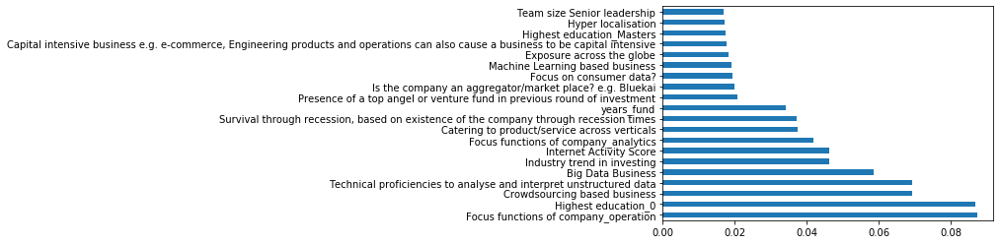

In [436]:
feat_importances = pd.Series(xgb.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.show()